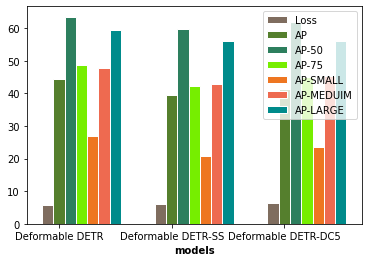

In [1]:
import numpy as np
import matplotlib.pyplot as plt
 
# set width of bars
barWidth = 0.1


Loss = [5.9, 6.2, 6.24]
AP = [44.5, 39.4, 41.4]
APFifty = [63.5, 59.7,61.8]
APSevenFive = [48.7, 42.2, 44.9]
APSMALL = [26.8,20.7,23.7]
APMEDIUM = [47.7,43.0,45.3]
APLARGE  = [59.5,55.9,56.0]

 
# Set position of bar on X axis
r1 = np.arange(len(Loss))
r2 = [x + barWidth for x in r1]
r3 = [x + barWidth for x in r2]
r4 = [x + barWidth for x in r3]
r5 = [x + barWidth for x in r4]
r6 = [x + barWidth for x in r5]
r7 = [x + barWidth for x in r6]
 
# Make the plot
plt.bar(r1, Loss, color='#7f6d5f', width=barWidth, edgecolor='white', label='Loss')
plt.bar(r2,AP, color='#557f2d', width=barWidth, edgecolor='white', label='AP')
plt.bar(r3,APFifty, color='#2d7f5e', width=barWidth, edgecolor='white', label='AP-50')
plt.bar(r4,APSevenFive, color='#76EE00', width=barWidth, edgecolor='white', label='AP-75')
plt.bar(r5,APSMALL, color='#EE7621', width=barWidth, edgecolor='white', label='AP-SMALL')
plt.bar(r6,APMEDIUM, color='#EE6A50', width=barWidth, edgecolor='white', label='AP-MEDUIM')
plt.bar(r7,APLARGE, color='#008B8B', width=barWidth, edgecolor='white', label='AP-LARGE')
 
# Add xticks on the middle of the group bars
plt.xlabel('models', fontweight='bold')
plt.xticks([r + barWidth for r in range(len(Loss))], ['Deformable DETR', 'Deformable DETR-SS', 'Deformable DETR-DC5'])
 
# Create legend & Show graphic
plt.legend()
plt.show()

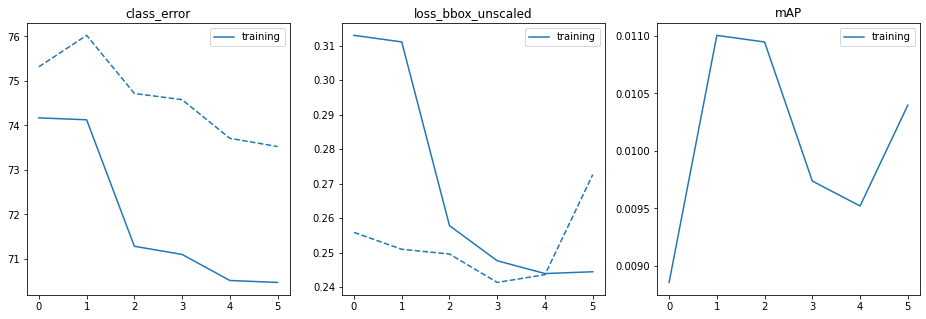

In [3]:
"""
Plotting utilities to visualize training logs.
"""
# import torch
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

from pathlib import Path, PurePath


def plot_logs(logs, fields=('class_error', 'loss_bbox_unscaled', 'mAP'), ewm_col=0, log_name='voc_traininglogs.txt'):
    '''
    Function to plot specific fields from training log(s). Plots both training and test results.

    :: Inputs - logs = list containing Path objects, each pointing to individual dir with a log file
              - fields = which results to plot from each log file - plots both training and test for each field.
              - ewm_col = optional, which column to use as the exponential weighted smoothing of the plots
              - log_name = optional, name of log file if different than default 'log.txt'.

    :: Outputs - matplotlib plots of results in fields, color coded for each log file.
               - solid lines are training results, dashed lines are test results.

    '''
    func_name = "plot_utils.py::plot_logs"

    # verify logs is a list of Paths (list[Paths]) or single Pathlib object Path,
    # convert single Path to list to avoid 'not iterable' error

    if not isinstance(logs, list):
        if isinstance(logs, PurePath):
            logs = [logs]
            print(f"{func_name} info: logs param expects a list argument, converted to list[Path].")
        else:
            raise ValueError(f"{func_name} - invalid argument for logs parameter.\n \
            Expect list[Path] or single Path obj, received {type(logs)}")

    # Quality checks - verify valid dir(s), that every item in list is Path object, and that log_name exists in each dir
    for i, dir in enumerate(logs):
        if not isinstance(dir, PurePath):
            raise ValueError(f"{func_name} - non-Path object in logs argument of {type(dir)}: \n{dir}")
        if not dir.exists():
            raise ValueError(f"{func_name} - invalid directory in logs argument:\n{dir}")
        # verify log_name exists
        fn = Path(dir / log_name)
        if not fn.exists():
            print(f"-> missing {log_name}.  Have you gotten to Epoch 1 in training?")
            print(f"--> full path of missing log file: {fn}")
            return

    # load log file(s) and plot
    dfs = [pd.read_json(Path(p) / log_name, lines=True) for p in logs]

    fig, axs = plt.subplots(ncols=len(fields), figsize=(16, 5))

    for df, color in zip(dfs, sns.color_palette(n_colors=len(logs))):
        for j, field in enumerate(fields):
            if field == 'mAP':
                coco_eval = pd.DataFrame(
                    np.stack(df.test_coco_eval_bbox.dropna().values)[:, 1]
                ).ewm(com=ewm_col).mean()
                axs[j].plot(coco_eval, c=color)
            else:
                df.interpolate().ewm(com=ewm_col).mean().plot(
                    y=[f'train_{field}', f'test_{field}'],
                    ax=axs[j],
                    color=[color] * 2,
                    style=['-', '--']
                )
    for ax, field in zip(axs, fields):
        ax.legend(["training" for p in logs])
        ax.set_title(field)


def plot_precision_recall(files, naming_scheme='iter'):
    if naming_scheme == 'exp_id':
        # name becomes exp_id
        names = [f.parts[-3] for f in files]
    elif naming_scheme == 'iter':
        names = [f.stem for f in files]
    else:
        raise ValueError(f'not supported {naming_scheme}')
    fig, axs = plt.subplots(ncols=2, figsize=(16, 5))
    for f, color, name in zip(files, sns.color_palette("Blues", n_colors=len(files)), names):
        data = torch.load(f)
        # precision is n_iou, n_points, n_cat, n_area, max_det
        precision = data['precision']
        recall = data['params'].recThrs
        scores = data['scores']
        # take precision for all classes, all areas and 100 detections
        precision = precision[0, :, :, 0, -1].mean(1)
        scores = scores[0, :, :, 0, -1].mean(1)
        prec = precision.mean()
        rec = data['recall'][0, :, 0, -1].mean()
        print(f'{naming_scheme} {name}: mAP@50={prec * 100: 05.1f}, ' +
              f'score={scores.mean():0.3f}, ' +
              f'f1={2 * prec * rec / (prec + rec + 1e-8):0.3f}'
              )
        axs[0].plot(recall, precision, c=color)
        axs[1].plot(recall, scores, c=color)

    axs[0].set_title('Precision / Recall')
    axs[0].legend(names)
    axs[1].set_title('Scores / Recall')
    axs[1].legend(names)
    return fig, axs


import pathlib
u= pathlib.Path("/Users/abayomi/Desktop/coding-assignment-week-10-rec-2/notebooks/")
plot_logs([u])


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
cd /content/drive/MyDrive/Deformable-DETR/

/content/drive/MyDrive/Deformable-DETR


In [ ]:
!wget https://repo.anaconda.com/miniconda/Miniconda3-py37_4.8.2-Linux-x86_64.sh
!bash Miniconda3-py37_4.8.2-Linux-x86_64.sh

--2021-10-24 23:48:40--  https://repo.anaconda.com/miniconda/Miniconda3-py37_4.8.2-Linux-x86_64.sh
Resolving repo.anaconda.com (repo.anaconda.com)... 104.16.131.3, 104.16.130.3, 2606:4700::6810:8303, ...
Connecting to repo.anaconda.com (repo.anaconda.com)|104.16.131.3|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 85055499 (81M) [application/x-sh]
Saving to: ‘Miniconda3-py37_4.8.2-Linux-x86_64.sh.5’

Miniconda3-py37_4.8 100%[===================>]  81.12M  76.8MB/s    in 1.1s    

2021-10-24 23:48:41 (76.8 MB/s) - ‘Miniconda3-py37_4.8.2-Linux-x86_64.sh.5’ saved [85055499/85055499]


Welcome to Miniconda3 4.8.2

In order to continue the installation process, please review the license
agreement.
Please, press ENTER to continue
>>> 
End User License Agreement - Anaconda Individual Edition

Copyright 2015-2020, Anaconda, Inc.

All rights reserved under the 3-clause BSD License:

This End User License Agreement (the "Agreement") is a legal agreement between y
ou an

In [ ]:
!/root/miniconda3/bin/conda install pytorch=1.5.1 torchvision=0.6.1 cudatoolkit=11 -c pytorch

Solving environment: - \ | / - \ | / - \ | done

## Package Plan ##

  environment location: /root/miniconda3

  added / updated specs:
    - cudatoolkit=11
    - pytorch=1.5.1
    - torchvision=0.6.1


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    _openmp_mutex-4.5          |            1_gnu          22 KB
    blas-1.0                   |              mkl           6 KB
    ca-certificates-2021.9.30  |       h06a4308_1         116 KB
    certifi-2021.10.8          |   py37h06a4308_0         151 KB
    conda-4.10.3               |   py37h06a4308_0         2.9 MB
    cpuonly-1.0                |                0           2 KB  pytorch
    cudatoolkit-11.3.1         |       h2bc3f7f_2       549.3 MB
    freetype-2.10.4            |       h5ab3b9f_0         596 KB
    giflib-5.2.1               |       h7b6447c_0          78 KB
    intel-openmp-2021.3.0      |    h

In [ ]:
!pip install -r requirements.txt

In [ ]:
cd models/ops

/content/drive/My Drive/Deformable-DETR/models/ops


In [ ]:
!sh ./make.sh
# unit test (should see all checking is True)


running build
running build_py
running build_ext
/usr/local/lib/python3.7/dist-packages/torch/utils/cpp_extension.py:370: UserWarning: Attempted to use ninja as the BuildExtension backend but we could not find ninja.. Falling back to using the slow distutils backend.
  warnings.warn(msg.format('we could not find ninja.'))
running install
running bdist_egg
running egg_info
writing MultiScaleDeformableAttention.egg-info/PKG-INFO
writing dependency_links to MultiScaleDeformableAttention.egg-info/dependency_links.txt
writing top-level names to MultiScaleDeformableAttention.egg-info/top_level.txt
writing manifest file 'MultiScaleDeformableAttention.egg-info/SOURCES.txt'
installing library code to build/bdist.linux-x86_64/egg
running install_lib
creating build/bdist.linux-x86_64/egg
creating build/bdist.linux-x86_64/egg/functions
copying build/lib.linux-x86_64-3.7/functions/ms_deform_attn_func.py -> build/bdist.linux-x86_64/egg/functions
copying build/lib.linux-x86_64-3.7/functions/__init__.

In [ ]:
cd ..

/content/drive/My Drive/Deformable-DETR


In [ ]:
pwd

'/content/drive/My Drive/Deformable-DETR'

In [ ]:
!chmod 755 -R "/content/drive/My Drive/Deformable-DETR/configs/r50_deformable_detr_single_scale.sh"

In [ ]:
!"/content/drive/My Drive/Deformable-DETR/configs/r50_deformable_detr_single_scale.sh" --epochs=50 --backbone='resnet101' --resume  "/content/drive/MyDrive/Deformable-DETR/r50_deformable_detr_single_scale-checkpoint.pth" --eval

+ EXP_DIR=exps/r50_deformable_detr_single_scale
+ PY_ARGS='--epochs=50 --backbone=resnet101 --resume /content/drive/MyDrive/Deformable-DETR/r50_deformable_detr_single_scale-checkpoint.pth --eval'
+ python -u main.py --num_feature_levels 1 --output_dir exps/r50_deformable_detr_single_scale --epochs=50 --backbone=resnet101 --resume /content/drive/MyDrive/Deformable-DETR/r50_deformable_detr_single_scale-checkpoint.pth --eval
Not using distributed mode
git:
  sha: 11169a60c33333af00a4849f1808023eba96a931, status: has uncommited changes, branch: main

Namespace(aux_loss=True, backbone='resnet101', batch_size=2, bbox_loss_coef=5, cache_mode=False, clip_max_norm=0.1, cls_loss_coef=2, coco_panoptic_path=None, coco_path='./datasets/coco', dataset_file='coco', dec_layers=6, dec_n_points=4, device='cuda', dice_loss_coef=1, dilation=False, dim_feedforward=1024, distributed=False, dropout=0.1, enc_layers=6, enc_n_points=4, epochs=50, eval=True, focal_alpha=0.25, frozen_weights=None, giou_loss_coef=

In [ ]:
!"/content/drive/My Drive/Deformable-DETR/configs/r50_deformable_detr_single_scale.sh" --epochs=50 --backbone='resnet152' --resume  "/content/drive/MyDrive/Deformable-DETR/r50_deformable_detr_single_scale-checkpoint.pth" --eval

/bin/bash: /content/drive/My Drive/Deformable-DETR/configs/r50_deformable_detr_single_scale.sh: /usr/bin/env: bad interpreter: Permission denied


In [ ]:
!chmod 755 -R "/content/drive/My Drive/Deformable-DETR/r50_deformable_detr_single_scale-checkpoint.pth"

chmod: changing permissions of '/content/drive/My Drive/Deformable-DETR/r50_deformable_detr_single_scale-checkpoint.pth': Operation not permitted


In [ ]:
!"/content/drive/My Drive/Deformable-DETR/configs/r50_deformable_detr_single_scale.sh" --epochs=100 --resume  "/content/drive/MyDrive/Deformable-DETR/r50_deformable_detr_single_scale-checkpoint.pth" --eval

+ EXP_DIR=exps/r50_deformable_detr_single_scale
+ PY_ARGS='--epochs=100 --resume /content/drive/MyDrive/Deformable-DETR/r50_deformable_detr_single_scale-checkpoint.pth --eval'
+ python -u main.py --num_feature_levels 1 --output_dir exps/r50_deformable_detr_single_scale --epochs=100 --resume /content/drive/MyDrive/Deformable-DETR/r50_deformable_detr_single_scale-checkpoint.pth --eval
Not using distributed mode
git:
  sha: 11169a60c33333af00a4849f1808023eba96a931, status: has uncommited changes, branch: main

Namespace(aux_loss=True, backbone='resnet50', batch_size=2, bbox_loss_coef=5, cache_mode=False, clip_max_norm=0.1, cls_loss_coef=2, coco_panoptic_path=None, coco_path='./datasets/coco', dataset_file='coco', dec_layers=6, dec_n_points=4, device='cuda', dice_loss_coef=1, dilation=False, dim_feedforward=1024, distributed=False, dropout=0.1, enc_layers=6, enc_n_points=4, epochs=100, eval=True, focal_alpha=0.25, frozen_weights=None, giou_loss_coef=2, hidden_dim=256, lr=0.0002, lr_backbon

In [ ]:
!"/content/drive/My Drive/Deformable-DETR/configs/r50_deformable_detr_single_scale.sh" --epochs=150 --resume  "/content/drive/MyDrive/Deformable-DETR/r50_deformable_detr_single_scale-checkpoint.pth" --eval

+ EXP_DIR=exps/r50_deformable_detr_single_scale
+ PY_ARGS='--epochs=150 --resume /content/drive/MyDrive/Deformable-DETR/r50_deformable_detr_single_scale-checkpoint.pth --eval'
+ python -u main.py --num_feature_levels 1 --output_dir exps/r50_deformable_detr_single_scale --epochs=150 --resume /content/drive/MyDrive/Deformable-DETR/r50_deformable_detr_single_scale-checkpoint.pth --eval
Not using distributed mode
git:
  sha: 11169a60c33333af00a4849f1808023eba96a931, status: has uncommited changes, branch: main

Namespace(aux_loss=True, backbone='resnet50', batch_size=2, bbox_loss_coef=5, cache_mode=False, clip_max_norm=0.1, cls_loss_coef=2, coco_panoptic_path=None, coco_path='./datasets/coco', dataset_file='coco', dec_layers=6, dec_n_points=4, device='cuda', dice_loss_coef=1, dilation=False, dim_feedforward=1024, distributed=False, dropout=0.1, enc_layers=6, enc_n_points=4, epochs=150, eval=True, focal_alpha=0.25, frozen_weights=None, giou_loss_coef=2, hidden_dim=256, lr=0.0002, lr_backbon

In [ ]:
!"/content/drive/My Drive/Deformable-DETR/configs/r50_deformable_detr_single_scale.sh" --epochs=200 --resume  "/content/drive/MyDrive/Deformable-DETR/r50_deformable_detr_single_scale-checkpoint.pth" --eval

+ EXP_DIR=exps/r50_deformable_detr_single_scale
+ PY_ARGS='--epochs=200 --resume /content/drive/MyDrive/Deformable-DETR/r50_deformable_detr_single_scale-checkpoint.pth --eval'
+ python -u main.py --num_feature_levels 1 --output_dir exps/r50_deformable_detr_single_scale --epochs=200 --resume /content/drive/MyDrive/Deformable-DETR/r50_deformable_detr_single_scale-checkpoint.pth --eval
Not using distributed mode
git:
  sha: 11169a60c33333af00a4849f1808023eba96a931, status: has uncommited changes, branch: main

Namespace(aux_loss=True, backbone='resnet50', batch_size=2, bbox_loss_coef=5, cache_mode=False, clip_max_norm=0.1, cls_loss_coef=2, coco_panoptic_path=None, coco_path='./datasets/coco', dataset_file='coco', dec_layers=6, dec_n_points=4, device='cuda', dice_loss_coef=1, dilation=False, dim_feedforward=1024, distributed=False, dropout=0.1, enc_layers=6, enc_n_points=4, epochs=200, eval=True, focal_alpha=0.25, frozen_weights=None, giou_loss_coef=2, hidden_dim=256, lr=0.0002, lr_backbon

In [ ]:
!"/content/drive/My Drive/Deformable-DETR/configs/r50_deformable_detr_single_scale.sh" --epochs=250 --resume  "/content/drive/MyDrive/Deformable-DETR/r50_deformable_detr_single_scale-checkpoint.pth" --eval

+ EXP_DIR=exps/r50_deformable_detr_single_scale
+ PY_ARGS='--epochs=250 --resume /content/drive/MyDrive/Deformable-DETR/r50_deformable_detr_single_scale-checkpoint.pth --eval'
+ python -u main.py --num_feature_levels 1 --output_dir exps/r50_deformable_detr_single_scale --epochs=250 --resume /content/drive/MyDrive/Deformable-DETR/r50_deformable_detr_single_scale-checkpoint.pth --eval
Not using distributed mode
git:
  sha: 11169a60c33333af00a4849f1808023eba96a931, status: has uncommited changes, branch: main

Namespace(aux_loss=True, backbone='resnet50', batch_size=2, bbox_loss_coef=5, cache_mode=False, clip_max_norm=0.1, cls_loss_coef=2, coco_panoptic_path=None, coco_path='./datasets/coco', dataset_file='coco', dec_layers=6, dec_n_points=4, device='cuda', dice_loss_coef=1, dilation=False, dim_feedforward=1024, distributed=False, dropout=0.1, enc_layers=6, enc_n_points=4, epochs=250, eval=True, focal_alpha=0.25, frozen_weights=None, giou_loss_coef=2, hidden_dim=256, lr=0.0002, lr_backbon

In [ ]:
!"/content/drive/My Drive/Deformable-DETR/configs/r50_deformable_detr_single_scale.sh" --epochs=300 --resume  "/content/drive/MyDrive/Deformable-DETR/r50_deformable_detr_single_scale-checkpoint.pth" --eval

+ EXP_DIR=exps/r50_deformable_detr_single_scale
+ PY_ARGS='--epochs=300 --resume /content/drive/MyDrive/Deformable-DETR/r50_deformable_detr_single_scale-checkpoint.pth --eval'
+ python -u main.py --num_feature_levels 1 --output_dir exps/r50_deformable_detr_single_scale --epochs=300 --resume /content/drive/MyDrive/Deformable-DETR/r50_deformable_detr_single_scale-checkpoint.pth --eval
Not using distributed mode
git:
  sha: 11169a60c33333af00a4849f1808023eba96a931, status: has uncommited changes, branch: main

Namespace(aux_loss=True, backbone='resnet50', batch_size=2, bbox_loss_coef=5, cache_mode=False, clip_max_norm=0.1, cls_loss_coef=2, coco_panoptic_path=None, coco_path='./datasets/coco', dataset_file='coco', dec_layers=6, dec_n_points=4, device='cuda', dice_loss_coef=1, dilation=False, dim_feedforward=1024, distributed=False, dropout=0.1, enc_layers=6, enc_n_points=4, epochs=300, eval=True, focal_alpha=0.25, frozen_weights=None, giou_loss_coef=2, hidden_dim=256, lr=0.0002, lr_backbon

In [ ]:
!"/content/drive/My Drive/Deformable-DETR/configs/r50_deformable_detr_single_scale.sh" --epochs=350 --resume  "/content/drive/MyDrive/Deformable-DETR/r50_deformable_detr_single_scale-checkpoint.pth" --eval

+ EXP_DIR=exps/r50_deformable_detr_single_scale
+ PY_ARGS='--epochs=350 --resume /content/drive/MyDrive/Deformable-DETR/r50_deformable_detr_single_scale-checkpoint.pth --eval'
+ python -u main.py --num_feature_levels 1 --output_dir exps/r50_deformable_detr_single_scale --epochs=350 --resume /content/drive/MyDrive/Deformable-DETR/r50_deformable_detr_single_scale-checkpoint.pth --eval
Not using distributed mode
git:
  sha: 11169a60c33333af00a4849f1808023eba96a931, status: has uncommited changes, branch: main

Namespace(aux_loss=True, backbone='resnet50', batch_size=2, bbox_loss_coef=5, cache_mode=False, clip_max_norm=0.1, cls_loss_coef=2, coco_panoptic_path=None, coco_path='./datasets/coco', dataset_file='coco', dec_layers=6, dec_n_points=4, device='cuda', dice_loss_coef=1, dilation=False, dim_feedforward=1024, distributed=False, dropout=0.1, enc_layers=6, enc_n_points=4, epochs=350, eval=True, focal_alpha=0.25, frozen_weights=None, giou_loss_coef=2, hidden_dim=256, lr=0.0002, lr_backbon

In [ ]:
!"/content/drive/My Drive/Deformable-DETR/configs/r50_deformable_detr_single_scale.sh" --epochs=400 --resume  "/content/drive/MyDrive/Deformable-DETR/r50_deformable_detr_single_scale-checkpoint.pth" --eval

+ EXP_DIR=exps/r50_deformable_detr_single_scale
+ PY_ARGS='--epochs=400 --resume /content/drive/MyDrive/Deformable-DETR/r50_deformable_detr_single_scale-checkpoint.pth --eval'
+ python -u main.py --num_feature_levels 1 --output_dir exps/r50_deformable_detr_single_scale --epochs=400 --resume /content/drive/MyDrive/Deformable-DETR/r50_deformable_detr_single_scale-checkpoint.pth --eval
Not using distributed mode
git:
  sha: 11169a60c33333af00a4849f1808023eba96a931, status: has uncommited changes, branch: main

Namespace(aux_loss=True, backbone='resnet50', batch_size=2, bbox_loss_coef=5, cache_mode=False, clip_max_norm=0.1, cls_loss_coef=2, coco_panoptic_path=None, coco_path='./datasets/coco', dataset_file='coco', dec_layers=6, dec_n_points=4, device='cuda', dice_loss_coef=1, dilation=False, dim_feedforward=1024, distributed=False, dropout=0.1, enc_layers=6, enc_n_points=4, epochs=400, eval=True, focal_alpha=0.25, frozen_weights=None, giou_loss_coef=2, hidden_dim=256, lr=0.0002, lr_backbon

In [ ]:
!"/content/drive/My Drive/Deformable-DETR/configs/r50_deformable_detr_single_scale.sh" --epochs=450 --resume  "/content/drive/MyDrive/Deformable-DETR/r50_deformable_detr_single_scale-checkpoint.pth" --eval

+ EXP_DIR=exps/r50_deformable_detr_single_scale
+ PY_ARGS='--epochs=450 --resume /content/drive/MyDrive/Deformable-DETR/r50_deformable_detr_single_scale-checkpoint.pth --eval'
+ python -u main.py --num_feature_levels 1 --output_dir exps/r50_deformable_detr_single_scale --epochs=450 --resume /content/drive/MyDrive/Deformable-DETR/r50_deformable_detr_single_scale-checkpoint.pth --eval
Not using distributed mode
git:
  sha: 11169a60c33333af00a4849f1808023eba96a931, status: has uncommited changes, branch: main

Namespace(aux_loss=True, backbone='resnet50', batch_size=2, bbox_loss_coef=5, cache_mode=False, clip_max_norm=0.1, cls_loss_coef=2, coco_panoptic_path=None, coco_path='./datasets/coco', dataset_file='coco', dec_layers=6, dec_n_points=4, device='cuda', dice_loss_coef=1, dilation=False, dim_feedforward=1024, distributed=False, dropout=0.1, enc_layers=6, enc_n_points=4, epochs=450, eval=True, focal_alpha=0.25, frozen_weights=None, giou_loss_coef=2, hidden_dim=256, lr=0.0002, lr_backbon

In [ ]:
!"/content/drive/My Drive/Deformable-DETR/configs/r50_deformable_detr_single_scale.sh" --epochs=500 --resume  "/content/drive/MyDrive/Deformable-DETR/r50_deformable_detr_single_scale-checkpoint.pth" --eval

+ EXP_DIR=exps/r50_deformable_detr_single_scale
+ PY_ARGS='--epochs=500 --resume /content/drive/MyDrive/Deformable-DETR/r50_deformable_detr_single_scale-checkpoint.pth --eval'
+ python -u main.py --num_feature_levels 1 --output_dir exps/r50_deformable_detr_single_scale --epochs=500 --resume /content/drive/MyDrive/Deformable-DETR/r50_deformable_detr_single_scale-checkpoint.pth --eval
Not using distributed mode
git:
  sha: 11169a60c33333af00a4849f1808023eba96a931, status: has uncommited changes, branch: main

Namespace(aux_loss=True, backbone='resnet50', batch_size=2, bbox_loss_coef=5, cache_mode=False, clip_max_norm=0.1, cls_loss_coef=2, coco_panoptic_path=None, coco_path='./datasets/coco', dataset_file='coco', dec_layers=6, dec_n_points=4, device='cuda', dice_loss_coef=1, dilation=False, dim_feedforward=1024, distributed=False, dropout=0.1, enc_layers=6, enc_n_points=4, epochs=500, eval=True, focal_alpha=0.25, frozen_weights=None, giou_loss_coef=2, hidden_dim=256, lr=0.0002, lr_backbon

In [ ]:
!chmod 755 -R "/content/drive/My Drive/Deformable-DETR/configs/r50_deformable_detr_single_scale_dc5.sh"

In [ ]:
!"/content/drive/My Drive/Deformable-DETR/configs/r50_deformable_detr_single_scale_dc5.sh" --epochs=100 --resume "/content/drive/MyDrive/Deformable-DETR/r50_deformable_detr_single_scale_dc5-checkpoint.pth" --eval

+ EXP_DIR=exps/r50_deformable_detr_single_scale_dc5
+ PY_ARGS='--epochs=100 --resume /content/drive/MyDrive/Deformable-DETR/r50_deformable_detr_single_scale_dc5-checkpoint.pth --eval'
+ python -u main.py --num_feature_levels 1 --dilation --output_dir exps/r50_deformable_detr_single_scale_dc5 --epochs=100 --resume /content/drive/MyDrive/Deformable-DETR/r50_deformable_detr_single_scale_dc5-checkpoint.pth --eval
Not using distributed mode
git:
  sha: 11169a60c33333af00a4849f1808023eba96a931, status: has uncommited changes, branch: main

Namespace(aux_loss=True, backbone='resnet50', batch_size=2, bbox_loss_coef=5, cache_mode=False, clip_max_norm=0.1, cls_loss_coef=2, coco_panoptic_path=None, coco_path='./datasets/coco', dataset_file='coco', dec_layers=6, dec_n_points=4, device='cuda', dice_loss_coef=1, dilation=True, dim_feedforward=1024, distributed=False, dropout=0.1, enc_layers=6, enc_n_points=4, epochs=100, eval=True, focal_alpha=0.25, frozen_weights=None, giou_loss_coef=2, hidden_dim=

In [ ]:
!"/content/drive/My Drive/Deformable-DETR/configs/r50_deformable_detr_single_scale_dc5.sh" --epochs=150 --resume "/content/drive/MyDrive/Deformable-DETR/r50_deformable_detr_single_scale_dc5-checkpoint.pth" --eval

+ EXP_DIR=exps/r50_deformable_detr_single_scale_dc5
+ PY_ARGS='--epochs=150 --resume /content/drive/MyDrive/Deformable-DETR/r50_deformable_detr_single_scale_dc5-checkpoint.pth --eval'
+ python -u main.py --num_feature_levels 1 --dilation --output_dir exps/r50_deformable_detr_single_scale_dc5 --epochs=150 --resume /content/drive/MyDrive/Deformable-DETR/r50_deformable_detr_single_scale_dc5-checkpoint.pth --eval
Not using distributed mode
git:
  sha: 11169a60c33333af00a4849f1808023eba96a931, status: has uncommited changes, branch: main

Namespace(aux_loss=True, backbone='resnet50', batch_size=2, bbox_loss_coef=5, cache_mode=False, clip_max_norm=0.1, cls_loss_coef=2, coco_panoptic_path=None, coco_path='./datasets/coco', dataset_file='coco', dec_layers=6, dec_n_points=4, device='cuda', dice_loss_coef=1, dilation=True, dim_feedforward=1024, distributed=False, dropout=0.1, enc_layers=6, enc_n_points=4, epochs=150, eval=True, focal_alpha=0.25, frozen_weights=None, giou_loss_coef=2, hidden_dim=

In [ ]:
!"/content/drive/My Drive/Deformable-DETR/configs/r50_deformable_detr_single_scale_dc5.sh" --epochs=200 --resume "/content/drive/MyDrive/Deformable-DETR/r50_deformable_detr_single_scale_dc5-checkpoint.pth" --eval

+ EXP_DIR=exps/r50_deformable_detr_single_scale_dc5
+ PY_ARGS='--epochs=200 --resume /content/drive/MyDrive/Deformable-DETR/r50_deformable_detr_single_scale_dc5-checkpoint.pth --eval'
+ python -u main.py --num_feature_levels 1 --dilation --output_dir exps/r50_deformable_detr_single_scale_dc5 --epochs=200 --resume /content/drive/MyDrive/Deformable-DETR/r50_deformable_detr_single_scale_dc5-checkpoint.pth --eval
Not using distributed mode
git:
  sha: 11169a60c33333af00a4849f1808023eba96a931, status: has uncommited changes, branch: main

Namespace(aux_loss=True, backbone='resnet50', batch_size=2, bbox_loss_coef=5, cache_mode=False, clip_max_norm=0.1, cls_loss_coef=2, coco_panoptic_path=None, coco_path='./datasets/coco', dataset_file='coco', dec_layers=6, dec_n_points=4, device='cuda', dice_loss_coef=1, dilation=True, dim_feedforward=1024, distributed=False, dropout=0.1, enc_layers=6, enc_n_points=4, epochs=200, eval=True, focal_alpha=0.25, frozen_weights=None, giou_loss_coef=2, hidden_dim=

In [ ]:
!"/content/drive/My Drive/Deformable-DETR/configs/r50_deformable_detr_single_scale_dc5.sh" --epochs=250 --resume "/content/drive/MyDrive/Deformable-DETR/r50_deformable_detr_single_scale_dc5-checkpoint.pth" --eval

+ EXP_DIR=exps/r50_deformable_detr_single_scale_dc5
+ PY_ARGS='--epochs=250 --resume /content/drive/MyDrive/Deformable-DETR/r50_deformable_detr_single_scale_dc5-checkpoint.pth --eval'
+ python -u main.py --num_feature_levels 1 --dilation --output_dir exps/r50_deformable_detr_single_scale_dc5 --epochs=250 --resume /content/drive/MyDrive/Deformable-DETR/r50_deformable_detr_single_scale_dc5-checkpoint.pth --eval
Not using distributed mode
git:
  sha: 11169a60c33333af00a4849f1808023eba96a931, status: has uncommited changes, branch: main

Namespace(aux_loss=True, backbone='resnet50', batch_size=2, bbox_loss_coef=5, cache_mode=False, clip_max_norm=0.1, cls_loss_coef=2, coco_panoptic_path=None, coco_path='./datasets/coco', dataset_file='coco', dec_layers=6, dec_n_points=4, device='cuda', dice_loss_coef=1, dilation=True, dim_feedforward=1024, distributed=False, dropout=0.1, enc_layers=6, enc_n_points=4, epochs=250, eval=True, focal_alpha=0.25, frozen_weights=None, giou_loss_coef=2, hidden_dim=

In [ ]:
!"/content/drive/My Drive/Deformable-DETR/configs/r50_deformable_detr_single_scale_dc5.sh" --epochs=300 --resume "/content/drive/MyDrive/Deformable-DETR/r50_deformable_detr_single_scale_dc5-checkpoint.pth" --eval

+ EXP_DIR=exps/r50_deformable_detr_single_scale_dc5
+ PY_ARGS='--epochs=300 --resume /content/drive/MyDrive/Deformable-DETR/r50_deformable_detr_single_scale_dc5-checkpoint.pth --eval'
+ python -u main.py --num_feature_levels 1 --dilation --output_dir exps/r50_deformable_detr_single_scale_dc5 --epochs=300 --resume /content/drive/MyDrive/Deformable-DETR/r50_deformable_detr_single_scale_dc5-checkpoint.pth --eval
Not using distributed mode
git:
  sha: 11169a60c33333af00a4849f1808023eba96a931, status: has uncommited changes, branch: main

Namespace(aux_loss=True, backbone='resnet50', batch_size=2, bbox_loss_coef=5, cache_mode=False, clip_max_norm=0.1, cls_loss_coef=2, coco_panoptic_path=None, coco_path='./datasets/coco', dataset_file='coco', dec_layers=6, dec_n_points=4, device='cuda', dice_loss_coef=1, dilation=True, dim_feedforward=1024, distributed=False, dropout=0.1, enc_layers=6, enc_n_points=4, epochs=300, eval=True, focal_alpha=0.25, frozen_weights=None, giou_loss_coef=2, hidden_dim=

In [ ]:
!"/content/drive/My Drive/Deformable-DETR/configs/r50_deformable_detr_single_scale_dc5.sh" --epochs=350 --resume "/content/drive/MyDrive/Deformable-DETR/r50_deformable_detr_single_scale_dc5-checkpoint.pth" --eval

+ EXP_DIR=exps/r50_deformable_detr_single_scale_dc5
+ PY_ARGS='--epochs=350 --resume /content/drive/MyDrive/Deformable-DETR/r50_deformable_detr_single_scale_dc5-checkpoint.pth --eval'
+ python -u main.py --num_feature_levels 1 --dilation --output_dir exps/r50_deformable_detr_single_scale_dc5 --epochs=350 --resume /content/drive/MyDrive/Deformable-DETR/r50_deformable_detr_single_scale_dc5-checkpoint.pth --eval
Not using distributed mode
git:
  sha: 11169a60c33333af00a4849f1808023eba96a931, status: has uncommited changes, branch: main

Namespace(aux_loss=True, backbone='resnet50', batch_size=2, bbox_loss_coef=5, cache_mode=False, clip_max_norm=0.1, cls_loss_coef=2, coco_panoptic_path=None, coco_path='./datasets/coco', dataset_file='coco', dec_layers=6, dec_n_points=4, device='cuda', dice_loss_coef=1, dilation=True, dim_feedforward=1024, distributed=False, dropout=0.1, enc_layers=6, enc_n_points=4, epochs=350, eval=True, focal_alpha=0.25, frozen_weights=None, giou_loss_coef=2, hidden_dim=

In [ ]:
!"/content/drive/My Drive/Deformable-DETR/configs/r50_deformable_detr_single_scale_dc5.sh" --epochs=400 --resume "/content/drive/MyDrive/Deformable-DETR/r50_deformable_detr_single_scale_dc5-checkpoint.pth" --eval

+ EXP_DIR=exps/r50_deformable_detr_single_scale_dc5
+ PY_ARGS='--epochs=400 --resume /content/drive/MyDrive/Deformable-DETR/r50_deformable_detr_single_scale_dc5-checkpoint.pth --eval'
+ python -u main.py --num_feature_levels 1 --dilation --output_dir exps/r50_deformable_detr_single_scale_dc5 --epochs=400 --resume /content/drive/MyDrive/Deformable-DETR/r50_deformable_detr_single_scale_dc5-checkpoint.pth --eval
Not using distributed mode
git:
  sha: 11169a60c33333af00a4849f1808023eba96a931, status: has uncommited changes, branch: main

Namespace(aux_loss=True, backbone='resnet50', batch_size=2, bbox_loss_coef=5, cache_mode=False, clip_max_norm=0.1, cls_loss_coef=2, coco_panoptic_path=None, coco_path='./datasets/coco', dataset_file='coco', dec_layers=6, dec_n_points=4, device='cuda', dice_loss_coef=1, dilation=True, dim_feedforward=1024, distributed=False, dropout=0.1, enc_layers=6, enc_n_points=4, epochs=400, eval=True, focal_alpha=0.25, frozen_weights=None, giou_loss_coef=2, hidden_dim=

In [ ]:
!"/content/drive/My Drive/Deformable-DETR/configs/r50_deformable_detr_single_scale_dc5.sh" --epochs=450 --resume "/content/drive/MyDrive/Deformable-DETR/r50_deformable_detr_single_scale_dc5-checkpoint.pth" --eval

+ EXP_DIR=exps/r50_deformable_detr_single_scale_dc5
+ PY_ARGS='--epochs=450 --resume /content/drive/MyDrive/Deformable-DETR/r50_deformable_detr_single_scale_dc5-checkpoint.pth --eval'
+ python -u main.py --num_feature_levels 1 --dilation --output_dir exps/r50_deformable_detr_single_scale_dc5 --epochs=450 --resume /content/drive/MyDrive/Deformable-DETR/r50_deformable_detr_single_scale_dc5-checkpoint.pth --eval
Not using distributed mode
git:
  sha: 11169a60c33333af00a4849f1808023eba96a931, status: has uncommited changes, branch: main

Namespace(aux_loss=True, backbone='resnet50', batch_size=2, bbox_loss_coef=5, cache_mode=False, clip_max_norm=0.1, cls_loss_coef=2, coco_panoptic_path=None, coco_path='./datasets/coco', dataset_file='coco', dec_layers=6, dec_n_points=4, device='cuda', dice_loss_coef=1, dilation=True, dim_feedforward=1024, distributed=False, dropout=0.1, enc_layers=6, enc_n_points=4, epochs=450, eval=True, focal_alpha=0.25, frozen_weights=None, giou_loss_coef=2, hidden_dim=

In [ ]:
!"/content/drive/My Drive/Deformable-DETR/configs/r50_deformable_detr_single_scale_dc5.sh" --epochs=500 --resume "/content/drive/MyDrive/Deformable-DETR/r50_deformable_detr_single_scale_dc5-checkpoint.pth" --eval

+ EXP_DIR=exps/r50_deformable_detr_single_scale_dc5
+ PY_ARGS='--epochs=500 --resume /content/drive/MyDrive/Deformable-DETR/r50_deformable_detr_single_scale_dc5-checkpoint.pth --eval'
+ python -u main.py --num_feature_levels 1 --dilation --output_dir exps/r50_deformable_detr_single_scale_dc5 --epochs=500 --resume /content/drive/MyDrive/Deformable-DETR/r50_deformable_detr_single_scale_dc5-checkpoint.pth --eval
Not using distributed mode
git:
  sha: 11169a60c33333af00a4849f1808023eba96a931, status: has uncommited changes, branch: main

Namespace(aux_loss=True, backbone='resnet50', batch_size=2, bbox_loss_coef=5, cache_mode=False, clip_max_norm=0.1, cls_loss_coef=2, coco_panoptic_path=None, coco_path='./datasets/coco', dataset_file='coco', dec_layers=6, dec_n_points=4, device='cuda', dice_loss_coef=1, dilation=True, dim_feedforward=1024, distributed=False, dropout=0.1, enc_layers=6, enc_n_points=4, epochs=500, eval=True, focal_alpha=0.25, frozen_weights=None, giou_loss_coef=2, hidden_dim=

In [ ]:
!chmod 755 -R "/content/drive/My Drive/Deformable-DETR/configs/r50_deformable_detr.sh"

In [ ]:
!"/content/drive/My Drive/Deformable-DETR/configs/r50_deformable_detr.sh" --epochs=100 --resume "/content/drive/MyDrive/Deformable-DETR/r50_deformable_detr-checkpoint.pth" --eval

+ EXP_DIR=exps/r50_deformable_detr
+ PY_ARGS='--epochs=100 --resume /content/drive/MyDrive/Deformable-DETR/r50_deformable_detr-checkpoint.pth --eval'
+ python -u main.py --output_dir exps/r50_deformable_detr --epochs=100 --resume /content/drive/MyDrive/Deformable-DETR/r50_deformable_detr-checkpoint.pth --eval
Not using distributed mode
git:
  sha: 11169a60c33333af00a4849f1808023eba96a931, status: has uncommited changes, branch: main

Namespace(aux_loss=True, backbone='resnet50', batch_size=2, bbox_loss_coef=5, cache_mode=False, clip_max_norm=0.1, cls_loss_coef=2, coco_panoptic_path=None, coco_path='./datasets/coco', dataset_file='coco', dec_layers=6, dec_n_points=4, device='cuda', dice_loss_coef=1, dilation=False, dim_feedforward=1024, distributed=False, dropout=0.1, enc_layers=6, enc_n_points=4, epochs=100, eval=True, focal_alpha=0.25, frozen_weights=None, giou_loss_coef=2, hidden_dim=256, lr=0.0002, lr_backbone=2e-05, lr_backbone_names=['backbone.0'], lr_drop=40, lr_drop_epochs=None,

In [ ]:
!"/content/drive/My Drive/Deformable-DETR/configs/r50_deformable_detr.sh" --epochs=150 --resume "/content/drive/MyDrive/Deformable-DETR/r50_deformable_detr-checkpoint.pth" --eval

+ EXP_DIR=exps/r50_deformable_detr
+ PY_ARGS='--epochs=150 --resume /content/drive/MyDrive/Deformable-DETR/r50_deformable_detr-checkpoint.pth --eval'
+ python -u main.py --output_dir exps/r50_deformable_detr --epochs=150 --resume /content/drive/MyDrive/Deformable-DETR/r50_deformable_detr-checkpoint.pth --eval
Not using distributed mode
git:
  sha: 11169a60c33333af00a4849f1808023eba96a931, status: has uncommited changes, branch: main

Namespace(aux_loss=True, backbone='resnet50', batch_size=2, bbox_loss_coef=5, cache_mode=False, clip_max_norm=0.1, cls_loss_coef=2, coco_panoptic_path=None, coco_path='./datasets/coco', dataset_file='coco', dec_layers=6, dec_n_points=4, device='cuda', dice_loss_coef=1, dilation=False, dim_feedforward=1024, distributed=False, dropout=0.1, enc_layers=6, enc_n_points=4, epochs=150, eval=True, focal_alpha=0.25, frozen_weights=None, giou_loss_coef=2, hidden_dim=256, lr=0.0002, lr_backbone=2e-05, lr_backbone_names=['backbone.0'], lr_drop=40, lr_drop_epochs=None,

In [ ]:
!"/content/drive/My Drive/Deformable-DETR/configs/r50_deformable_detr.sh" --epochs=200 --resume "/content/drive/MyDrive/Deformable-DETR/r50_deformable_detr-checkpoint.pth" --eval

+ EXP_DIR=exps/r50_deformable_detr
+ PY_ARGS='--epochs=200 --resume /content/drive/MyDrive/Deformable-DETR/r50_deformable_detr-checkpoint.pth --eval'
+ python -u main.py --output_dir exps/r50_deformable_detr --epochs=200 --resume /content/drive/MyDrive/Deformable-DETR/r50_deformable_detr-checkpoint.pth --eval
Not using distributed mode
git:
  sha: 11169a60c33333af00a4849f1808023eba96a931, status: has uncommited changes, branch: main

Namespace(aux_loss=True, backbone='resnet50', batch_size=2, bbox_loss_coef=5, cache_mode=False, clip_max_norm=0.1, cls_loss_coef=2, coco_panoptic_path=None, coco_path='./datasets/coco', dataset_file='coco', dec_layers=6, dec_n_points=4, device='cuda', dice_loss_coef=1, dilation=False, dim_feedforward=1024, distributed=False, dropout=0.1, enc_layers=6, enc_n_points=4, epochs=200, eval=True, focal_alpha=0.25, frozen_weights=None, giou_loss_coef=2, hidden_dim=256, lr=0.0002, lr_backbone=2e-05, lr_backbone_names=['backbone.0'], lr_drop=40, lr_drop_epochs=None,

In [ ]:
!"/content/drive/My Drive/Deformable-DETR/configs/r50_deformable_detr.sh" --epochs=250 --resume "/content/drive/MyDrive/Deformable-DETR/r50_deformable_detr-checkpoint.pth" --eval

+ EXP_DIR=exps/r50_deformable_detr
+ PY_ARGS='--epochs=250 --resume /content/drive/MyDrive/Deformable-DETR/r50_deformable_detr-checkpoint.pth --eval'
+ python -u main.py --output_dir exps/r50_deformable_detr --epochs=250 --resume /content/drive/MyDrive/Deformable-DETR/r50_deformable_detr-checkpoint.pth --eval
Not using distributed mode
git:
  sha: 11169a60c33333af00a4849f1808023eba96a931, status: has uncommited changes, branch: main

Namespace(aux_loss=True, backbone='resnet50', batch_size=2, bbox_loss_coef=5, cache_mode=False, clip_max_norm=0.1, cls_loss_coef=2, coco_panoptic_path=None, coco_path='./datasets/coco', dataset_file='coco', dec_layers=6, dec_n_points=4, device='cuda', dice_loss_coef=1, dilation=False, dim_feedforward=1024, distributed=False, dropout=0.1, enc_layers=6, enc_n_points=4, epochs=250, eval=True, focal_alpha=0.25, frozen_weights=None, giou_loss_coef=2, hidden_dim=256, lr=0.0002, lr_backbone=2e-05, lr_backbone_names=['backbone.0'], lr_drop=40, lr_drop_epochs=None,

In [ ]:
!"/content/drive/My Drive/Deformable-DETR/configs/r50_deformable_detr.sh" --epochs=300 --resume "/content/drive/MyDrive/Deformable-DETR/r50_deformable_detr-checkpoint.pth" --eval

+ EXP_DIR=exps/r50_deformable_detr
+ PY_ARGS='--epochs=300 --resume /content/drive/MyDrive/Deformable-DETR/r50_deformable_detr-checkpoint.pth --eval'
+ python -u main.py --output_dir exps/r50_deformable_detr --epochs=300 --resume /content/drive/MyDrive/Deformable-DETR/r50_deformable_detr-checkpoint.pth --eval
Not using distributed mode
git:
  sha: 11169a60c33333af00a4849f1808023eba96a931, status: has uncommited changes, branch: main

Namespace(aux_loss=True, backbone='resnet50', batch_size=2, bbox_loss_coef=5, cache_mode=False, clip_max_norm=0.1, cls_loss_coef=2, coco_panoptic_path=None, coco_path='./datasets/coco', dataset_file='coco', dec_layers=6, dec_n_points=4, device='cuda', dice_loss_coef=1, dilation=False, dim_feedforward=1024, distributed=False, dropout=0.1, enc_layers=6, enc_n_points=4, epochs=300, eval=True, focal_alpha=0.25, frozen_weights=None, giou_loss_coef=2, hidden_dim=256, lr=0.0002, lr_backbone=2e-05, lr_backbone_names=['backbone.0'], lr_drop=40, lr_drop_epochs=None,

In [ ]:
!"/content/drive/My Drive/Deformable-DETR/configs/r50_deformable_detr.sh" --epochs=350 --resume "/content/drive/MyDrive/Deformable-DETR/r50_deformable_detr-checkpoint.pth" --eval

+ EXP_DIR=exps/r50_deformable_detr
+ PY_ARGS='--epochs=350 --resume /content/drive/MyDrive/Deformable-DETR/r50_deformable_detr-checkpoint.pth --eval'
+ python -u main.py --output_dir exps/r50_deformable_detr --epochs=350 --resume /content/drive/MyDrive/Deformable-DETR/r50_deformable_detr-checkpoint.pth --eval
Not using distributed mode
git:
  sha: 11169a60c33333af00a4849f1808023eba96a931, status: has uncommited changes, branch: main

Namespace(aux_loss=True, backbone='resnet50', batch_size=2, bbox_loss_coef=5, cache_mode=False, clip_max_norm=0.1, cls_loss_coef=2, coco_panoptic_path=None, coco_path='./datasets/coco', dataset_file='coco', dec_layers=6, dec_n_points=4, device='cuda', dice_loss_coef=1, dilation=False, dim_feedforward=1024, distributed=False, dropout=0.1, enc_layers=6, enc_n_points=4, epochs=350, eval=True, focal_alpha=0.25, frozen_weights=None, giou_loss_coef=2, hidden_dim=256, lr=0.0002, lr_backbone=2e-05, lr_backbone_names=['backbone.0'], lr_drop=40, lr_drop_epochs=None,

In [ ]:
cd ..

/content/drive/My Drive/Deformable-DETR


In [ ]:
!"/content/drive/My Drive/Deformable-DETR/configs/r50_deformable_detr.sh" --epochs=400 --resume "/content/drive/MyDrive/Deformable-DETR/r50_deformable_detr-checkpoint.pth" --eval

+ EXP_DIR=exps/r50_deformable_detr
+ PY_ARGS='--epochs=400 --resume /content/drive/MyDrive/Deformable-DETR/r50_deformable_detr-checkpoint.pth --eval'
+ python -u main.py --output_dir exps/r50_deformable_detr --epochs=400 --resume /content/drive/MyDrive/Deformable-DETR/r50_deformable_detr-checkpoint.pth --eval
Not using distributed mode
git:
  sha: 11169a60c33333af00a4849f1808023eba96a931, status: has uncommited changes, branch: main

Namespace(aux_loss=True, backbone='resnet50', batch_size=2, bbox_loss_coef=5, cache_mode=False, clip_max_norm=0.1, cls_loss_coef=2, coco_panoptic_path=None, coco_path='./datasets/coco', dataset_file='coco', dec_layers=6, dec_n_points=4, device='cuda', dice_loss_coef=1, dilation=False, dim_feedforward=1024, distributed=False, dropout=0.1, enc_layers=6, enc_n_points=4, epochs=400, eval=True, focal_alpha=0.25, frozen_weights=None, giou_loss_coef=2, hidden_dim=256, lr=0.0002, lr_backbone=2e-05, lr_backbone_names=['backbone.0'], lr_drop=40, lr_drop_epochs=None,

In [ ]:
!"/content/drive/My Drive/Deformable-DETR/configs/r50_deformable_detr.sh" --epochs=450 --resume "/content/drive/MyDrive/Deformable-DETR/r50_deformable_detr-checkpoint.pth" --eval

+ EXP_DIR=exps/r50_deformable_detr
+ PY_ARGS='--epochs=450 --resume /content/drive/MyDrive/Deformable-DETR/r50_deformable_detr-checkpoint.pth --eval'
+ python -u main.py --output_dir exps/r50_deformable_detr --epochs=450 --resume /content/drive/MyDrive/Deformable-DETR/r50_deformable_detr-checkpoint.pth --eval
Not using distributed mode
git:
  sha: 11169a60c33333af00a4849f1808023eba96a931, status: has uncommited changes, branch: main

Namespace(aux_loss=True, backbone='resnet50', batch_size=2, bbox_loss_coef=5, cache_mode=False, clip_max_norm=0.1, cls_loss_coef=2, coco_panoptic_path=None, coco_path='./datasets/coco', dataset_file='coco', dec_layers=6, dec_n_points=4, device='cuda', dice_loss_coef=1, dilation=False, dim_feedforward=1024, distributed=False, dropout=0.1, enc_layers=6, enc_n_points=4, epochs=450, eval=True, focal_alpha=0.25, frozen_weights=None, giou_loss_coef=2, hidden_dim=256, lr=0.0002, lr_backbone=2e-05, lr_backbone_names=['backbone.0'], lr_drop=40, lr_drop_epochs=None,

In [ ]:
!"/content/drive/My Drive/Deformable-DETR/configs/r50_deformable_detr.sh" --epochs=500 --resume "/content/drive/MyDrive/Deformable-DETR/r50_deformable_detr-checkpoint.pth" --eval

+ EXP_DIR=exps/r50_deformable_detr
+ PY_ARGS='--epochs=500 --resume /content/drive/MyDrive/Deformable-DETR/r50_deformable_detr-checkpoint.pth --eval'
+ python -u main.py --output_dir exps/r50_deformable_detr --epochs=500 --resume /content/drive/MyDrive/Deformable-DETR/r50_deformable_detr-checkpoint.pth --eval
Not using distributed mode
git:
  sha: 11169a60c33333af00a4849f1808023eba96a931, status: has uncommited changes, branch: main

Namespace(aux_loss=True, backbone='resnet50', batch_size=2, bbox_loss_coef=5, cache_mode=False, clip_max_norm=0.1, cls_loss_coef=2, coco_panoptic_path=None, coco_path='./datasets/coco', dataset_file='coco', dec_layers=6, dec_n_points=4, device='cuda', dice_loss_coef=1, dilation=False, dim_feedforward=1024, distributed=False, dropout=0.1, enc_layers=6, enc_n_points=4, epochs=500, eval=True, focal_alpha=0.25, frozen_weights=None, giou_loss_coef=2, hidden_dim=256, lr=0.0002, lr_backbone=2e-05, lr_backbone_names=['backbone.0'], lr_drop=40, lr_drop_epochs=None,

In [ ]:
!"/content/drive/My Drive/Deformable-DETR/configs/r50_deformable_detr.sh" --epochs=50 --backbone=ResNet-101 --resume "/content/drive/MyDrive/Deformable-DETR/r50_deformable_detr-checkpoint.pth" --eval

/bin/bash: /content/drive/My Drive/Deformable-DETR/configs/r50_deformable_detr.sh: /usr/bin/env: bad interpreter: Permission denied


In [ ]:
!"/content/drive/My Drive/Deformable-DETR/configs/r50_deformable_detr.sh" --epochs=50 --backbone="resnet101" --resume "/content/drive/MyDrive/Deformable-DETR/r50_deformable_detr-checkpoint.pth" --eval

+ EXP_DIR=exps/r50_deformable_detr
+ PY_ARGS='--epochs=50 --backbone=resnet101 --resume /content/drive/MyDrive/Deformable-DETR/r50_deformable_detr-checkpoint.pth --eval'
+ python -u main.py --output_dir exps/r50_deformable_detr --epochs=50 --backbone=resnet101 --resume /content/drive/MyDrive/Deformable-DETR/r50_deformable_detr-checkpoint.pth --eval
Not using distributed mode
git:
  sha: 11169a60c33333af00a4849f1808023eba96a931, status: has uncommited changes, branch: main

Namespace(aux_loss=True, backbone='resnet101', batch_size=2, bbox_loss_coef=5, cache_mode=False, clip_max_norm=0.1, cls_loss_coef=2, coco_panoptic_path=None, coco_path='./datasets/coco', dataset_file='coco', dec_layers=6, dec_n_points=4, device='cuda', dice_loss_coef=1, dilation=False, dim_feedforward=1024, distributed=False, dropout=0.1, enc_layers=6, enc_n_points=4, epochs=50, eval=True, focal_alpha=0.25, frozen_weights=None, giou_loss_coef=2, hidden_dim=256, lr=0.0002, lr_backbone=2e-05, lr_backbone_names=['backbo

In [ ]:
!"/content/drive/My Drive/Deformable-DETR/configs/r50_deformable_detr_single_scale_dc5.sh" --epochs=50 --backbone="resnet101" --resume "/content/drive/MyDrive/Deformable-DETR/r50_deformable_detr_single_scale_dc5-checkpoint.pth" --eval

+ EXP_DIR=exps/r50_deformable_detr_single_scale_dc5
+ PY_ARGS='--epochs=50 --backbone=resnet101 --resume /content/drive/MyDrive/Deformable-DETR/r50_deformable_detr_single_scale_dc5-checkpoint.pth --eval'
+ python -u main.py --num_feature_levels 1 --dilation --output_dir exps/r50_deformable_detr_single_scale_dc5 --epochs=50 --backbone=resnet101 --resume /content/drive/MyDrive/Deformable-DETR/r50_deformable_detr_single_scale_dc5-checkpoint.pth --eval
Not using distributed mode
git:
  sha: 11169a60c33333af00a4849f1808023eba96a931, status: has uncommited changes, branch: main

Namespace(aux_loss=True, backbone='resnet101', batch_size=2, bbox_loss_coef=5, cache_mode=False, clip_max_norm=0.1, cls_loss_coef=2, coco_panoptic_path=None, coco_path='./datasets/coco', dataset_file='coco', dec_layers=6, dec_n_points=4, device='cuda', dice_loss_coef=1, dilation=True, dim_feedforward=1024, distributed=False, dropout=0.1, enc_layers=6, enc_n_points=4, epochs=50, eval=True, focal_alpha=0.25, frozen_wei

In [ ]:
!"/content/drive/My Drive/Deformable-DETR/configs/r50_deformable_detr.sh" --epochs=50 --backbone=resnet101 --resume "/content/drive/MyDrive/Deformable-DETR/r50_deformable_detr-checkpoint.pth" --eval

+ EXP_DIR=exps/r50_deformable_detr
+ PY_ARGS='--epochs=50 --backbone=resnet101 --resume /content/drive/MyDrive/Deformable-DETR/r50_deformable_detr-checkpoint.pth --eval'
+ python -u main.py --output_dir exps/r50_deformable_detr --epochs=50 --backbone=resnet101 --resume /content/drive/MyDrive/Deformable-DETR/r50_deformable_detr-checkpoint.pth --eval
Not using distributed mode
git:
  sha: 11169a60c33333af00a4849f1808023eba96a931, status: has uncommited changes, branch: main

Namespace(aux_loss=True, backbone='resnet101', batch_size=2, bbox_loss_coef=5, cache_mode=False, clip_max_norm=0.1, cls_loss_coef=2, coco_panoptic_path=None, coco_path='./datasets/coco', dataset_file='coco', dec_layers=6, dec_n_points=4, device='cuda', dice_loss_coef=1, dilation=False, dim_feedforward=1024, distributed=False, dropout=0.1, enc_layers=6, enc_n_points=4, epochs=50, eval=True, focal_alpha=0.25, frozen_weights=None, giou_loss_coef=2, hidden_dim=256, lr=0.0002, lr_backbone=2e-05, lr_backbone_names=['backbo